In [1]:
import matplotlib.pyplot as plt
from matplotlib.patches import Patch, RegularPolygon
from matplotlib import cm, colors
import matplotlib

import numpy as np
import pandas as pd

import os
import scanpy as sc

In [2]:
import scipy.stats as stats

In [3]:
harmo = pd.read_csv("/home/comp/cszrwang/project/GMGAT4Deconv/figures/mean_out_erher_breast_20_seed1.model.csv")['Cancer Epithelial']

In [4]:
coordinates = pd.read_csv("/home/comp/cszrwang/data/Breast/spadecon/bc_cor.txt",delimiter='\t')
coordinates

,x,y
0,50,102
1,59,19
2,14,94
3,47,13
4,73,43
...,...,...
3793,31,77
3794,58,42
3795,60,30
3796,45,27


In [5]:
st_ad = sc.read_h5ad('/home/comp/cszrwang/data/Breast/spadecon/gm_input_st.h5ad')
st_df = st_ad.to_df()

In [6]:
st_df['TFF3']

AAACAAGTATCTCCCA-1    15.0
AAACACCAATAACTGC-1    22.0
AAACAGAGCGACTCCT-1     4.0
AAACAGGGTCTATATT-1     4.0
AAACAGTGTTCCTGGG-1    70.0
                      ... 
TTGTTGTGTGTCAAGA-1    43.0
TTGTTTCACATCCAGG-1    10.0
TTGTTTCATTAGTCTA-1    11.0
TTGTTTCCATACAACT-1    26.0
TTGTTTGTGTAAATTC-1    23.0
Name: TFF3, Length: 3798, dtype: float32

In [7]:
stdgcn = pd.read_csv("/home/comp/cszrwang/results/Deconvolution/results/Breast_1/StdGCN/predict_result.csv")['Cancer Epithelial']
dwls = pd.read_csv("/home/comp/cszrwang/results/Deconvolution/results/Breast_1/SpatialDWLS/SpatialDWLS_result.csv")['Cancer Epithelial']
spacel = pd.read_csv("/home/comp/cszrwang/results/Deconvolution/results/Breast_1/SPACEL/SPACEL_result.csv")['Cancer Epithelial']
rctd = pd.read_csv("/home/comp/cszrwang/results/Deconvolution/results/Breast_1/RCTD/RCTD_output.csv")['Cancer Epithelial']
redeconve = pd.read_csv("/home/comp/cszrwang/results/Deconvolution/results/Breast_1/Redeconve/Redeconve.csv")['Cancer Epithelial']
card = pd.read_csv("/home/comp/cszrwang/results/Deconvolution/results/Breast_1/CARD/CARD_output.csv")['Cancer Epithelial']

In [8]:
mal_list = [harmo, stdgcn, dwls, spacel, rctd, redeconve, card]
name_list = ['HarmoDecon', 'StdGCN', 'SpatialDWLS', 'SPACEL', 'RCTD', 'Redeconve', 'CARD']
marker_names = ['PIP', 'PLEKHS1', 'NAT1', 'SHISA2', 'PDZK1IP1', 'TFAP2C', 'NPNT', 'SCUBE2', 'ASCL2', 'DNAJC1']

In [12]:
from sklearn.metrics.pairwise import cosine_similarity
import seaborn as sns

In [13]:
dir_out = "/home/comp/cszrwang/results/Deconvolution/results/Breast_1/Figures/"

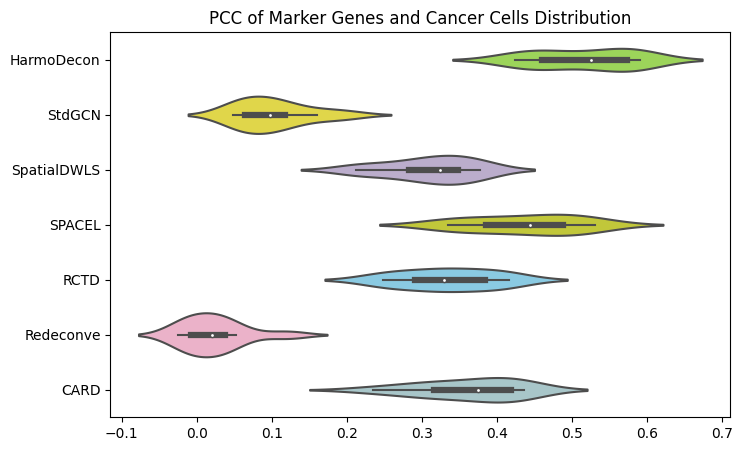

In [15]:
all_sc_list = []
for mal in mal_list:
    sc_list = []
    for name in marker_names:
#         print(len(mal))
        if len(mal) != len(st_df[name]):
            st_mk = st_df[name].drop(st_df[name].index[141])
#             sc = ssim(np.array(mal), np.array(st_mk))
            sc, p_value = stats.pearsonr(mal, st_mk)
        else:
            sc, p_value = stats.pearsonr(mal, st_df[name])
#             sc = ssim(np.array(mal), np.array(st_df[name]))
        sc_list.append(sc)
    all_sc_list.append(sc_list)
all_sc = pd.DataFrame(all_sc_list).T
all_sc.columns = name_list
# print(all_sc)
fig,axes = plt.subplots(ncols=1,nrows=1,figsize=(8,5))
order = name_list
colors = ["#9de846", '#F9EC31', "#BBA8D1","#D6DE23", "#7BD1F1", "#F5A8C7",  "#A2CBCF", "#988DC3", "#79c06e",'#00CED1',"#BBA8D1", "#9dff46", "#E6AB02", "#FCCDE5", "#CCFFFF", "#dddddd", "#cccccc", "#aaaaaa"]
sns.violinplot(data=all_sc,order=order,palette=colors,ax=axes,orient='h', showfliers = False,showmeans=True)
axes.set_title('PCC of Marker Genes and Cancer Cells Distribution')
plt.savefig(dir_out+'/pcc_box_plot.jpg',dpi=300,bbox_inches='tight')
plt.show()

In [16]:
from scipy import stats

statistic, p_value = stats.wilcoxon(all_sc['HarmoDecon'], all_sc['SPACEL'])

print("statistic", statistic)
print("p_value:", p_value)

statistic 0.0
p_value: 0.001953125


In [17]:
# Draw Distribution Figures
# Draw Distribution Figures
gene_1 = np.log(st_df['NAT1']+0.1)
gene_1.index = harmo.index
gene_2 = np.log(st_df['SHISA2']+0.1)
gene_2.index = harmo.index
distribution = [harmo, stdgcn, dwls, spacel, rctd, redeconve, card, gene_1, gene_2]
dis_df = pd.DataFrame(distribution).T
dis_columns = name_list.copy()
dis_columns.append('NAT1')
dis_columns.append('SHISA2')
dis_df.columns = dis_columns
dis_df

,HarmoDecon,StdGCN,SpatialDWLS,SPACEL,RCTD,Redeconve,CARD,NAT1,SHISA2
0,0.002452,0.028566,0.000000,0.000000,0.347547,0.121856,0.109488,-2.302585,-2.302585
1,0.412127,0.190681,0.723832,0.392615,0.796450,0.283300,0.310243,-2.302585,1.629241
2,0.000499,0.060946,0.000000,0.081047,0.390501,0.161073,0.113129,-2.302585,0.095310
3,0.000784,0.005107,0.000000,0.000000,0.236976,0.000000,0.044695,-2.302585,0.095310
4,0.436934,0.100878,0.643051,0.312490,0.733620,0.314396,0.278850,1.410987,1.960095
...,...,...,...,...,...,...,...,...,...
3793,0.175517,0.127574,0.673087,0.362640,0.752718,0.297263,0.286633,0.095310,1.808289
3794,0.161755,0.194750,0.467825,0.231202,0.582949,0.167389,0.180020,0.741937,1.131402
3795,0.399841,0.209700,0.665049,0.314399,0.744123,0.229657,0.286336,1.131402,0.095310
3796,0.004392,0.016367,0.000000,0.116785,0.376295,0.102630,0.133357,-2.302585,-2.302585


In [18]:
def plot_results_bulk_ST_by_spot(coordinates, metadata, dir_out, output_prefix, geometry='honeycomb', num_cols=3):
 
    # Define output files
    fout_png_all = os.path.join(dir_out, f"{output_prefix}cell_type_assignments_by_spot.png")
    fout_pdf_all = os.path.join(dir_out, f"{output_prefix}cell_type_assignments_by_spot.pdf")
    
#     coordinates = coordinates.loc[metadata.index,:]
#     cell_types = list(metadata.columns)[:-1]
    cell_types = list(metadata.columns)
    cell_types = list(np.sort(cell_types))
#     cell_types.insert(0,'Total cells')

    X = coordinates.iloc[:,0]
    Y = coordinates.iloc[:,1]
    
    # distinguish between row/col indices and coordinates
    # based on range (500) and type (int vs. float) of values
    scale = Y.max() < 500 and ((Y - Y.round()).abs() < 1e-5).all()

    # define representative interval between each adjacent spot/point
    y_int = 1 if scale else np.median(np.unique(np.diff(np.sort(np.unique(Y)))))
    x_int = 1 if scale else np.median(np.unique(np.diff(np.sort(np.unique(X)))))
    
    if geometry == 'honeycomb' and scale:
        print('Detecting row and column indexing of Visium data; rescaling for coordinates')
        
        # Rotate
        X_prev = X
        Y_prev = Y
        X = Y_prev
        Y = 1-X_prev
        
        # Rescale
        Y = 1.75*Y

    elif geometry == 'square' and scale:
        print('Detecting row and column indexing of legacy ST data; rotating for coordinates')
        
        # Rotate
        X_prev = X
        Y_prev = Y
        X = Y_prev
        Y = 1-X_prev

    else:        
        # Rotate 
        Y = 1-Y
        
    if geometry == 'honeycomb':
        hex_vert = 6

        if scale:
            hex_rot = 0
            hex_rad = y_int
            hex_rad = hex_rad + 0.2*hex_rad

        else:
            hex_rot = 0
            hex_rad = x_int
            hex_rad = hex_rad + 0.28*hex_rad

    elif geometry == 'square':
        hex_vert = 4
        hex_rot = 45
        interval = y_int
        hex_rad = 0.5*np.sqrt(2*interval**2)

    else:
        print("Unknown geometry specified.")
        exit()

    num_rows = int(len(cell_types)/num_cols)
    if num_rows*num_cols < len(cell_types):
        num_rows = num_rows+1
    width = max(X)-min(X)
    height = max(Y)-min(Y)

#     plt.rc('font', **{'family': 'sans-serif', 'sans-serif': ['sans-serif'], 'size':'12'})
    plt.rcParams['figure.dpi'] = 450
    plt.rcParams['savefig.dpi'] = 450

    fig, axes = plt.subplots(num_rows,num_cols,figsize=(width/height*3*num_cols,3*num_rows))
    full_frac = 0.047 * (3*num_rows / (width/height*3*num_cols))
    k = 0
    for i in range(num_rows):
        for j in range(num_cols):

            ax = axes[i,j]

            if k >= len(cell_types):
                ax.axis('off')
            else:
                ct = cell_types[k]
                ax.set_aspect('equal')

                node_assignment = metadata.loc[:,ct]

                viridis = cm.get_cmap('viridis')
                norm = matplotlib.colors.Normalize(min(node_assignment), max(node_assignment))

                node_assignment = (1/max(node_assignment))*node_assignment
                colors = viridis(node_assignment)

                for x, y, c in zip(X, Y, colors):
                    hex = RegularPolygon((x, y), numVertices=hex_vert, radius=hex_rad, 
                                         orientation=np.radians(hex_rot), 
                                         facecolor=c, edgecolor=None)
                    ax.add_patch(hex)

                # Also add scatter points in hexagon centres - not sure why this line has to be here
                ax.scatter(X, Y, c=[c[0] for c in colors],alpha=0)
                ct_label = ct
                # Reformat labels that are too long
                if len(ct_label)>14:
                    ct_label = format_label(ct_label)
                ax.set_title(ct_label)
                cax = plt.colorbar(cm.ScalarMappable(norm=norm, cmap=viridis),ax=ax,label='',fraction=0.036, pad = 0.04)
                
                ticks = cax.get_ticks()
            
                ticks = cax.get_ticks()

                new_ticks = np.linspace(norm.vmin, norm.vmax, len(ticks))

                cax.set_ticks(new_ticks)
                cax.set_ticklabels([f'{tick:.2f}' for tick in new_ticks])

                ax.axis('off')
                
#                 ticks = list(ticks)
                
#                 ticks.pop()
                
#                 ticks[0] = norm.vmin
 
#                 ticks = np.array(ticks)
#                 ticks = np.append(ticks, norm.vmax)

#                 cax.set_ticks(ticks)
#                 cax.set_ticklabels([f'{tick:.2f}' for tick in ticks])
#                 ax.axis('off')

            k += 1

    fig.tight_layout()
    fig.subplots_adjust(top=0.92)
#     fig.suptitle('Distribution of Malignmant Cells and Marker Genes')
    plt.show()
    fig.savefig(fout_png_all, facecolor="w", bbox_inches='tight')
    fig.savefig(fout_pdf_all, facecolor="w", bbox_inches='tight')

Detecting row and column indexing of Visium data; rescaling for coordinates


/tmp/ipykernel_415170/3123814915.py:98: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed two minor releases later. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap(obj)`` instead.
  viridis = cm.get_cmap('viridis')


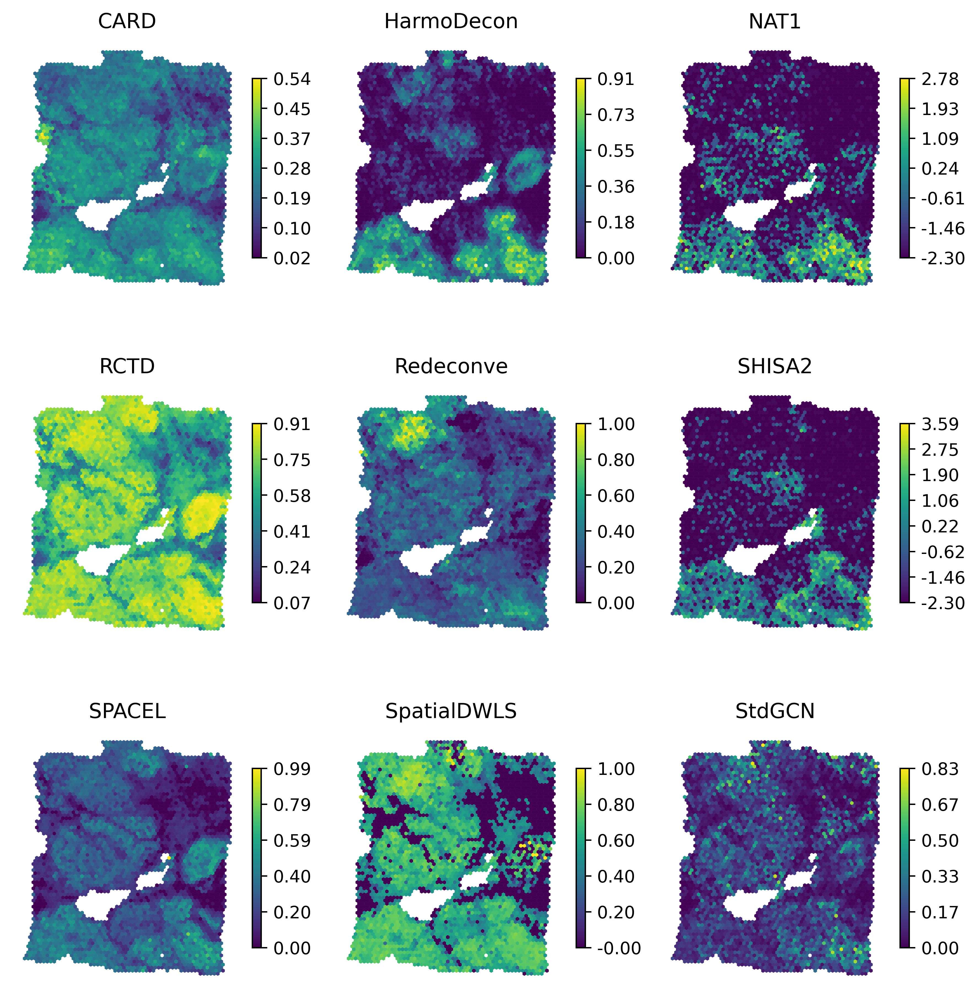

In [19]:
output_prefix = "breast_1_methods_7"
plot_results_bulk_ST_by_spot(coordinates, dis_df, dir_out, output_prefix, geometry='honeycomb', num_cols=3)

In [20]:
harmo_df = pd.read_csv("/home/comp/cszrwang/project/GMGAT4Deconv/figures/mean_out_erher_breast_20_seed1.model.csv")

In [22]:
def format_label(label,max_length=14,max_lines=3):
    label_words = label.split(' ')
    label_chunks = []
    chunk = ''
    for word in label_words:
        if len(chunk)==0:
            if len(word)>max_length:
                word = word[:max_length]+'...'
                label_chunks.append(word)
            else:
                chunk += word
        elif len(chunk)+len(word)<=(max_length-1):
            chunk = chunk+' '+word
        else:
            label_chunks.append(chunk)
            chunk = word
    if len(chunk)>0:
        label_chunks.append(chunk)
    
    if len(label_chunks)>max_lines:
        label_chunks = label_chunks[:max_lines]
        last_line = label_chunks[-1]
        if len(last_line)>(max_length-3):
            label_chunks[-1] = last_line[:max_length]+'...'
        else: 
            label_chunks[-1] = last_line+'...'

    return '\n'.join(label_chunks)

Detecting row and column indexing of Visium data; rescaling for coordinates


/tmp/ipykernel_415170/3123814915.py:98: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed two minor releases later. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap(obj)`` instead.
  viridis = cm.get_cmap('viridis')


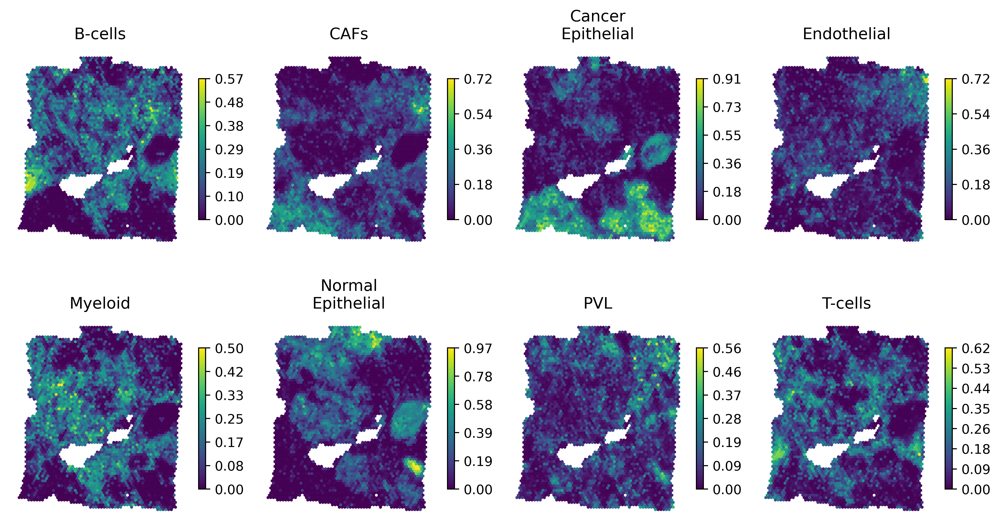

In [23]:
output_prefix = "breast_1_harmo"
plot_results_bulk_ST_by_spot(coordinates, harmo_df, dir_out, output_prefix, geometry='honeycomb', num_cols=4)

In [24]:
marker_names = ['PIP', 'PLEKHS1', 'NAT1', 'SHISA2', 'PDZK1IP1', 'TFAP2C', 'NPNT', 'SCUBE2', 'ASCL2', 'DNAJC1']

In [25]:
# Draw Distribution Figures
# Draw Distribution Figures
gene_1 = np.log(st_df['PIP']+0.1)
gene_1.index = harmo.index
gene_2 = np.log(st_df['PLEKHS1']+0.1)
gene_2.index = harmo.index
gene_3 = np.log(st_df['NAT1']+0.1)
gene_3.index = harmo.index
gene_4 = np.log(st_df['SHISA2']+0.1)
gene_4.index = harmo.index
gene_5 = np.log(st_df['PDZK1IP1']+0.1)
gene_5.index = harmo.index
gene_6 = np.log(st_df['TFAP2C']+0.1)
gene_6.index = harmo.index
gene_7 = np.log(st_df['NPNT']+0.1)
gene_7.index = harmo.index
gene_8 = np.log(st_df['SCUBE2']+0.1)
gene_8.index = harmo.index
gene_9 = np.log(st_df['ASCL2']+0.1)
gene_9.index = harmo.index
gene_10 = np.log(st_df['DNAJC1']+0.1)
gene_10.index = harmo.index
distribution = [gene_1, gene_2, gene_3, gene_4, gene_5, gene_6, gene_7, gene_8, gene_9, gene_10]
dis_df = pd.DataFrame(distribution).T
# dis_columns = name_list.copy()
# dis_columns.append('NAT1')
dis_df.columns = marker_names
dis_df

,PIP,PLEKHS1,NAT1,SHISA2,PDZK1IP1,TFAP2C,NPNT,SCUBE2,ASCL2,DNAJC1
0,-2.302585,0.095310,-2.302585,-2.302585,-2.302585,-2.302585,-2.302585,-2.302585,-2.302585,-2.302585
1,0.095310,0.741937,-2.302585,1.629241,0.741937,1.131402,1.629241,3.000720,1.808289,2.646175
2,-2.302585,-2.302585,-2.302585,0.095310,-2.302585,-2.302585,-2.302585,-2.302585,-2.302585,0.095310
3,-2.302585,0.095310,-2.302585,0.095310,-2.302585,-2.302585,-2.302585,-2.302585,0.741937,1.131402
4,0.095310,0.741937,1.410987,1.960095,0.741937,0.741937,1.629241,0.741937,1.808289,1.960095
...,...,...,...,...,...,...,...,...,...,...
3793,-2.302585,-2.302585,0.095310,1.808289,-2.302585,0.095310,-2.302585,-2.302585,-2.302585,0.095310
3794,-2.302585,0.741937,0.741937,1.131402,0.095310,-2.302585,0.741937,-2.302585,0.095310,0.095310
3795,-2.302585,1.131402,1.131402,0.095310,0.095310,0.095310,2.091864,1.629241,1.410987,1.808289
3796,-2.302585,0.095310,-2.302585,-2.302585,-2.302585,0.095310,-2.302585,0.741937,-2.302585,0.095310


Detecting row and column indexing of Visium data; rescaling for coordinates


/tmp/ipykernel_415170/3123814915.py:98: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed two minor releases later. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap(obj)`` instead.
  viridis = cm.get_cmap('viridis')


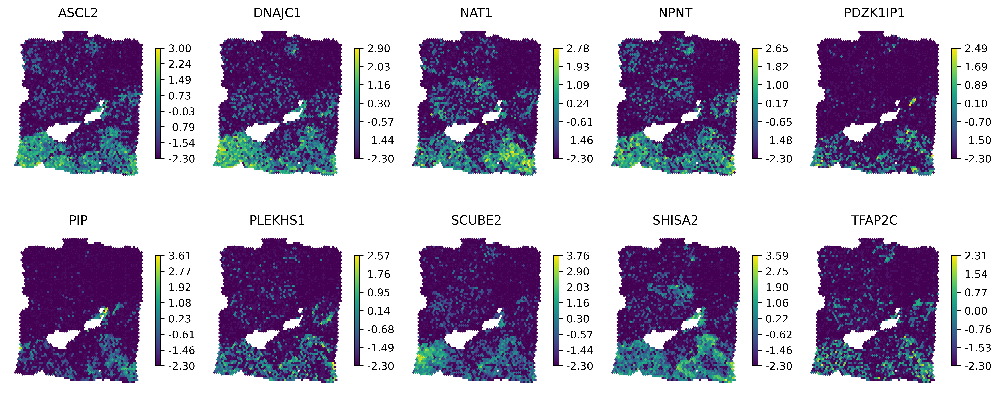

In [26]:
output_prefix = "breast_1_genes_10"
plot_results_bulk_ST_by_spot(coordinates, dis_df, dir_out, output_prefix, geometry='honeycomb', num_cols=5)

In [27]:
# all methods
DSTG = pd.read_csv("/home/comp/cszrwang/results/Deconvolution/results/Breast_1/DSTG/predict_output.csv")['Cancer.Epithelial']
spotlight = pd.read_csv("/home/comp/cszrwang/results/Deconvolution/results/Breast_1/SPOTlight/SPOTlight_output.csv")['Cancer Epithelial']
stereoscope = pd.read_csv("/home/comp/cszrwang/results/Deconvolution/results/Breast_1/Stereoscope/Stereoscope_result.csv")['Cancer Epithelial']
tangram = pd.read_csv("/home/comp/cszrwang/results/Deconvolution/results/Breast_1/Tangram/Tangram_result.csv")['Cancer Epithelial']

In [28]:
cell2location = pd.read_csv("/home/comp/cszrwang/results/Deconvolution/results/Breast_1/Cell2location/Cell2location_result.csv")

In [29]:
cell2location.reset_index()
cell2location = cell2location.drop('Unnamed: 0', axis=1)
cell2location

,B-cells,CAFs,Cancer Epithelial,Endothelial,Myeloid,Normal Epithelial,PVL,T-cells
0,0.959965,1.038811,1.519521,0.208544,1.898247,0.331030,0.028421,2.239019
1,0.468231,0.979137,20.783341,1.633861,1.686597,12.125274,0.972098,0.938391
2,1.910668,0.340870,1.032116,0.457446,0.237535,0.225759,0.278014,0.099830
3,9.672384,0.457453,1.515777,0.321330,1.976071,0.791431,0.147707,6.569266
4,0.128560,5.158411,18.773534,1.516906,2.298681,9.026483,0.291683,0.301803
...,...,...,...,...,...,...,...,...
3793,0.165017,0.855885,8.452815,0.115415,1.495887,3.151720,0.037275,0.195300
3794,0.091440,0.956364,7.453799,0.651998,5.531007,1.701528,0.255352,0.441093
3795,0.197889,1.384914,16.866167,1.701078,1.668291,6.091792,1.302658,0.286055
3796,0.304742,2.883975,2.918024,0.807023,1.480537,0.742184,0.548991,2.860521


In [30]:
row_sums = cell2location.sum(axis=1)
cell2location = cell2location.div(row_sums, axis=0)
cell2location

,B-cells,CAFs,Cancer Epithelial,Endothelial,Myeloid,Normal Epithelial,PVL,T-cells
0,0.116734,0.126321,0.184777,0.025359,0.230830,0.040254,0.003456,0.272269
1,0.011828,0.024734,0.525005,0.041273,0.042605,0.306295,0.024556,0.023705
2,0.416973,0.074389,0.225243,0.099830,0.051838,0.049268,0.060672,0.021786
3,0.450897,0.021325,0.070661,0.014979,0.092118,0.036894,0.006886,0.306239
4,0.003429,0.137572,0.500680,0.040455,0.061305,0.240731,0.007779,0.008049
...,...,...,...,...,...,...,...,...
3793,0.011405,0.059152,0.584189,0.007977,0.103383,0.217821,0.002576,0.013498
3794,0.005353,0.055985,0.436339,0.038167,0.323781,0.099606,0.014948,0.025821
3795,0.006708,0.046948,0.571757,0.057666,0.056554,0.206510,0.044160,0.009697
3796,0.024290,0.229872,0.232586,0.064325,0.118009,0.059157,0.043758,0.228003


In [31]:
mal_list = [harmo, stdgcn, dwls, spacel, rctd, redeconve, card, cell2location['Cancer Epithelial'], DSTG, spotlight, stereoscope, tangram]
name_list = ['HarmoDecon', 'StdGCN', 'SpatialDWLS', 'SPACEL', 'RCTD', 'Redeconve', 'CARD', 'Cell2Location', 'DSTG', 'Spotlight', 'Stereoscope', 'Tangram']

In [32]:
dis_df = pd.DataFrame(mal_list).T
dis_df.columns = name_list.copy()
dis_df

,HarmoDecon,StdGCN,SpatialDWLS,SPACEL,RCTD,Redeconve,CARD,Cell2Location,DSTG,Spotlight,Stereoscope,Tangram
0,0.002452,0.028566,0.000000,0.000000,0.347547,0.121856,0.109488,0.184777,0.0649,0.035858,5.478049e-02,0.000106
1,0.412127,0.190681,0.723832,0.392615,0.796450,0.283300,0.310243,0.525005,0.0743,0.105580,2.755017e-01,0.171810
2,0.000499,0.060946,0.000000,0.081047,0.390501,0.161073,0.113129,0.225243,0.0655,0.046387,1.360781e-01,0.005326
3,0.000784,0.005107,0.000000,0.000000,0.236976,0.000000,0.044695,0.070661,0.0575,0.023960,2.014745e-08,0.000191
4,0.436934,0.100878,0.643051,0.312490,0.733620,0.314396,0.278850,0.500680,0.0716,0.103084,2.679918e-01,0.120491
...,...,...,...,...,...,...,...,...,...,...,...,...
3793,0.175517,0.127574,0.673087,0.362640,0.752718,0.297263,0.286633,0.584189,0.0746,0.118979,2.351049e-01,0.151296
3794,0.161755,0.194750,0.467825,0.231202,0.582949,0.167389,0.180020,0.436339,0.0722,0.089858,1.774768e-01,0.071051
3795,0.399841,0.209700,0.665049,0.314399,0.744123,0.229657,0.286336,0.571757,0.0741,0.113180,2.756878e-01,0.150612
3796,0.004392,0.016367,0.000000,0.116785,0.376295,0.102630,0.133357,0.232586,0.0677,0.049696,1.628095e-01,0.000559


Detecting row and column indexing of Visium data; rescaling for coordinates


/tmp/ipykernel_415170/3123814915.py:98: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed two minor releases later. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap(obj)`` instead.
  viridis = cm.get_cmap('viridis')


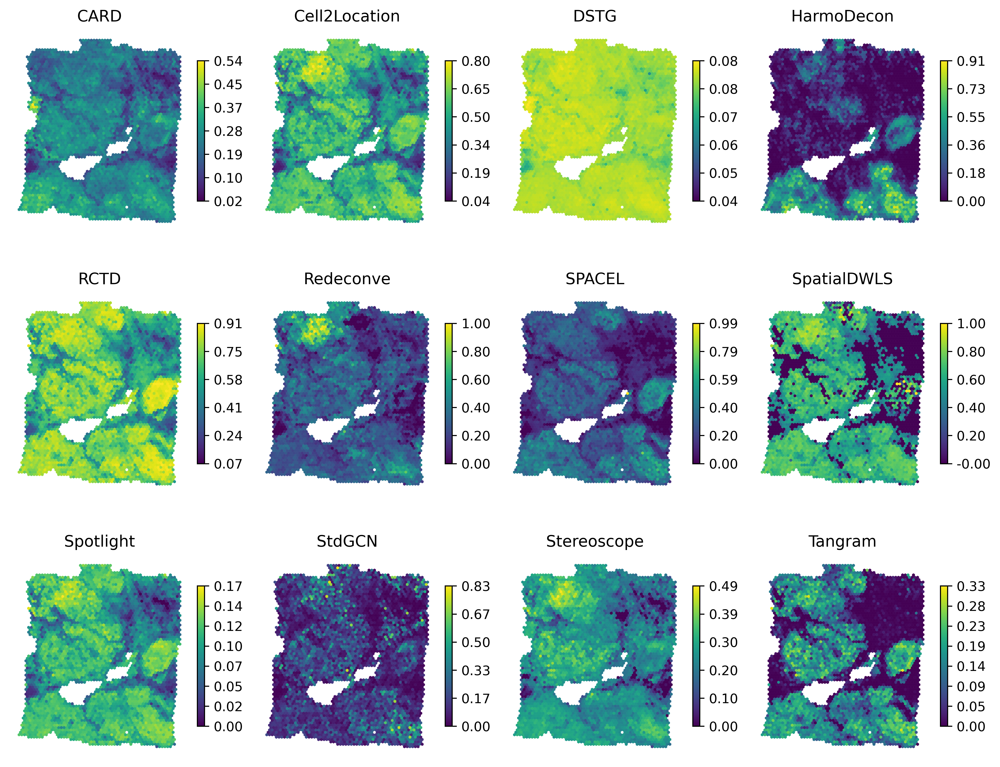

In [33]:
output_prefix = "breast_1_methods_12"
plot_results_bulk_ST_by_spot(coordinates, dis_df, dir_out, output_prefix, geometry='honeycomb', num_cols=4)

   HarmoDecon    StdGCN  SpatialDWLS    SPACEL      RCTD  Redeconve      CARD  \
0    0.423501  0.105021     0.211733  0.335955  0.248401   0.041336  0.235053   
1    0.466715  0.091062     0.281820  0.419666  0.320901  -0.024206  0.332743   
2    0.574639  0.198616     0.376169  0.518115  0.409297   0.120573  0.421126   
3    0.543522  0.104972     0.316426  0.416126  0.321315   0.029574  0.310422   
4    0.435670  0.062979     0.227600  0.334477  0.250785  -0.009115  0.291096   
5    0.506713  0.159935     0.334697  0.489324  0.391845   0.052238  0.377740   
6    0.588082  0.121833     0.377432  0.530456  0.416050   0.025308  0.425307   
7    0.458386  0.048901     0.285095  0.375152  0.280461  -0.001440  0.371199   
8    0.590880  0.070389     0.352593  0.484297  0.362662   0.016535  0.435478   
9    0.567145  0.057645     0.332701  0.467873  0.337293  -0.013550  0.412736   

   Cell2Location      DSTG  Spotlight  Stereoscope   Tangram  
0       0.207085  0.112280   0.221880     0.1

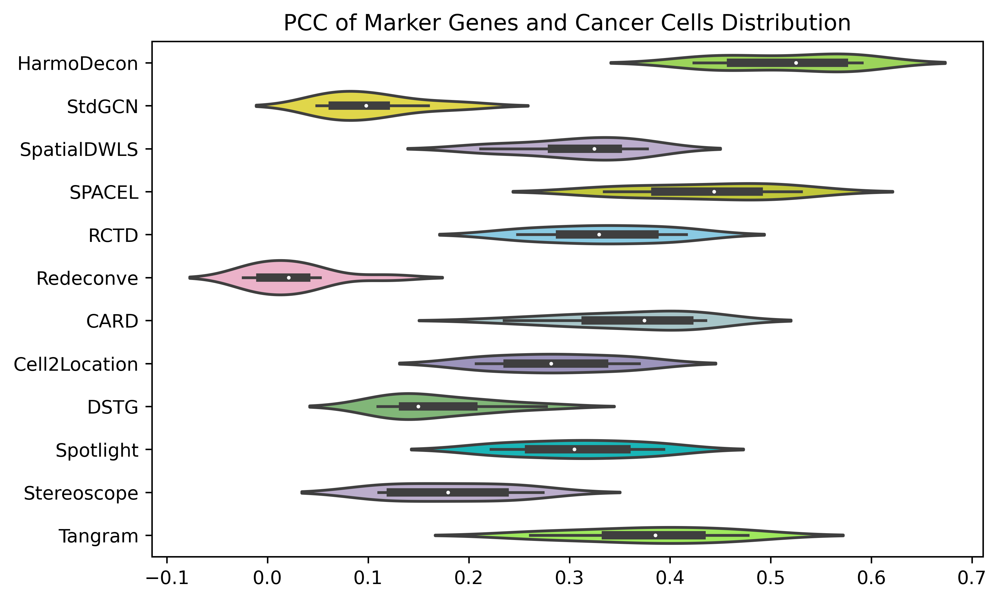

In [34]:
all_sc_list = []
for mal in mal_list:
    sc_list = []
    for name in marker_names:
#         print(len(mal))
        if len(mal) != len(st_df[name]):
            st_mk = st_df[name].drop(st_df[name].index[141])
#             sc = ssim(np.array(mal), np.array(st_mk))
            sc, p_value = stats.pearsonr(mal, st_mk)
        else:
            sc, p_value = stats.pearsonr(mal, st_df[name])
#             sc = ssim(np.array(mal), np.array(st_df[name]))
        sc_list.append(sc)
    all_sc_list.append(sc_list)
all_sc = pd.DataFrame(all_sc_list).T
all_sc.columns = name_list
print(all_sc)
fig,axes = plt.subplots(ncols=1,nrows=1,figsize=(8,5))
order = name_list
colors = ["#9de846", '#F9EC31', "#BBA8D1","#D6DE23", "#7BD1F1", "#F5A8C7",  "#A2CBCF", "#988DC3", "#79c06e",'#00CED1',"#BBA8D1", "#9dff46", "#E6AB02", "#FCCDE5", "#CCFFFF", "#dddddd", "#cccccc", "#aaaaaa"]
sns.violinplot(data=all_sc,order=order,palette=colors,ax=axes,orient='h', showfliers = False,showmeans=True)
axes.set_title('PCC of Marker Genes and Cancer Cells Distribution')
plt.savefig(dir_out+'/pcc_box_plot.jpg',dpi=300,bbox_inches='tight')
plt.show()